#Project Kuler
Github: https://github.com/hongsups/kuler
Blog: http://www.hongsup.com/kuler
<img src="files/img_vstm_stim.png"><p>
During my PhD, I ran human behavioral experiments to test visual memory. Sometimes the displays had colors. Participants always said my experiments looked so pretty. Although these colors were randomly chosen, I also found myself more aesthetically pleased with certain combinations of colors.
<p>
<img src="files/img_kuler_1.png">
<p>
<a href = "https://color.adobe.com/">Adobe Kuler</a> is a website where one can create, explore, and share a color theme consisting of five colors. Each color theme has a name ("Vitamin C", "Honey Pot", etc.). Users vote for prettier themes and anyone can download the information about any themes on the website. People use these themes for their presentations or product design. As of 2015, the website has thousands of color themes.
<p>
<img src="files/img_kuler_2.png">
<p>
I already knew about the Kuler long time ago, and have always wondered why certain color themes were more popular than the others. Also, it seems like there are some sort of patterns among popular themes. So, as a transition from neuroscience to data science, I decided to find the hidden relationship between colors across themes (namely, "Project Kuler"). As of July 2015, the work is still in progress. I found some interesting preliminary results using unsupervised learning. This iPython Notebook is to share my findings with public.

###I. Scrape data
- [Using XML](https://github.com/hongsups/kuler/blob/master/kuler_scrape_xml.ipynb)
- [Using JSON response](https://github.com/hongsups/kuler/blob/master/kuler_scrape_json.ipynb)
<p>
Keys:
**author**, comment, **createAt**, **tags**, description, harmony, href, originalTheme, access, **like**, **view**, **rating**, **swatches (color)**, **name**, **id**, editedAt

###II. Clean data
- [Clean and extract the data using pandas](https://github.com/hongsups/kuler/blob/master/kuler_cleaning_data.ipynb)
- [Convert color space from RGB to Lab](https://github.com/hongsups/kuler/blob/master/kuler_rgb_to_lab.ipynb)

###[III. Explore the non-color data](https://github.com/hongsups/kuler/blob/master/kuler_explore_non_color.ipynb)
- Check website activity
- Select a measure of user preference

###[VI. Implement user preference](https://github.com/hongsups/kuler/blob/master/kuler_pref.ipynb)
- Feature scaling
- Duplicate data based on popularity

###[V. Visualize the color data in Lab space](https://github.com/hongsups/kuler/blob/master/kuler_vis_color_data.ipynb)

- Visualize all colors in one figure
- Sanity check: RGB vs. Lab
- Visualize a color theme

###[VI. Clustering analysis](#6)
- [Select features](#6-1)
- [Run K-means clustering](#6-2)
- [Find the right K](#6-3) 
    - [<font color='blue'>Fig. Silhouette score vs. K</font>](#s_score)
    - [<font color='blue'>Fig. AIC vs. K</font>](#AIC)
- [Visualize each theme in the same cluster](#6-4)
    - [<font color='blue'>Fig. ClusterIdx = 0</font>](#1_theme)
- [Visualize all themes in the same cluster](#6-5)
    - [<font color='blue'>Fig. Color clouds</font>](#col_cloud)

###[Future plans](http://www.hongsup.com/blog/2015/6/25/checkpoint-1)
- Analysis
    - Color anchors: what's it about the first and the last?
    - Clustering: dimensionality reduction, different features and algorithms
    - Find the formula: Gaussian approximation of the color clouds
- Visualization
    - Interactive color clouds
    - Color dominance
- Web application: recommender engine
    - Choice of colors
    - Choice of "mood" (word tags)
    - Better color rules

<a id= '6'></a>
##VI. Clustering analysis
<a id='6-1'></a>
###1. Select features
<b>Attempt 1</b>: Run a cluster analysis for each theme without considering the absolute colors and order. I discared this idea because sample size is too small to cluster each theme (n=5). For more details, read [here](http://www.hongsup.com/blog/2015/6/25/clustering-analysis).<p>
<b>Attempt 2</b>: Use 10D distance vector and ignore colors. This gives some decent clusters but it cannot capture complete spatial relationships between the colors. See [here](https://github.com/hongsups/kuler/blob/master/Project_Kuler.ipynb) for details.<p>
<b>Current version</b>: We now use L, a, and b coordinates from 5 colors in a theme, which results in 15D coordinate vector.

In [1]:
#Import modules
import numpy as np
import pandas as pd
from pandas import Series,DataFrame
import scipy as sp

# plotting
import seaborn as sns
sns.set(style="whitegrid")
import matplotlib.pyplot as plt
import matplotlib.cm as pltcm
%matplotlib inline

# colormath: color conversion and distance calculation
import colormath as cm

In [2]:
# Load data
df = pd.read_pickle('kuler_df')
# df_: color data only
# df_ = pd.read_pickle('kuler_df_')
# Preference-implemented data
df_ = pd.read_pickle('kuler_df_pref_v1')

In [62]:
df15D = df_.loc[:,df_.columns[5:]]
df15D.head()

,L1,a1,b1,L2,a2,b2,L3,a3,b3,L4,a4,b4,L5,a5,b5
0,89.069487,-6.647432,25.488440,66.456120,-4.708159,19.791822,92.841824,-4.553276,16.870606,38.737716,-13.159783,-22.994372,16.690247,-14.674573,-4.314988
1,52.008432,-29.908512,12.316387,94.439699,-5.544871,38.112912,77.656126,19.323349,67.586364,45.431402,42.319465,42.079384,32.413371,41.558880,44.787768
2,99.537232,-2.720550,4.416912,85.952582,-8.612370,13.614931,67.428997,-11.279473,3.796465,38.789667,-7.945213,-12.368756,20.219828,-5.798749,-11.268986
3,61.740369,58.130239,53.472005,98.119573,-13.817677,46.798128,88.383724,-27.790981,32.276771,71.174490,-31.433780,16.582808,59.861686,-42.328110,3.968937
4,34.988404,-18.435996,-10.862802,97.807379,-4.272050,18.366629,86.206740,2.016274,68.654114,69.314413,13.426557,60.131030,46.733104,45.388782,37.462243


In [6]:
# 15D vector
data = df15D.values

<a id='6-2'></a>
###2. Run K-means clustering

In [7]:
def run_Kmeans(data,n_clusters,init='k-means++', n_init=10, max_iter=300):
    """ Takea df.values as first input alongside with sklearn kmeans parameters 
        Gives labels, centroids, and kmeans as output
    """
    from sklearn import cluster
    kmeans = cluster.KMeans(n_clusters=n_clusters,init=init,n_init=n_init,max_iter=max_iter)
    kmeans.fit(data)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    return labels, centroids, kmeans

<a id ='6-3'></a>
###3. Finding the right K
<a id ='6-3-1'></a>
####3.1 Silhouette score

In [159]:
def plot_s_score(data,range_n_clusters,init='k-means++', n_init=50, max_iter=300,plot=True):
    """ 
        Run kmeans for each n_cluster in range_n_clusters, and compute silhouette score. 
        Create a plot of silhouette scroe vs. number of clusters
    
    """
    s_score_vec = []
    from sklearn.metrics import silhouette_score
    for n_clusters in range_n_clusters:
        labels, centroids, kmeans = run_Kmeans(data,n_clusters,n_init=n_init,max_iter=max_iter)    
        silhouette_avg = silhouette_score(data, labels)
        s_score_vec.append(silhouette_avg)
    if plot==True:
        fig,ax = plt.subplots(1, 1)
        fig.set_size_inches(12, 6)
        ax.plot(range_n_clusters, s_score_vec, marker = 'o', lw = 2)
        ax.set_title('Silhouette score in KMeans')
        ax.set_xlabel('Number of clusters (K)')
        ax.set_ylabel('Score')  
        plt.show()
    return s_score_vec

Intuitively, silhouette score shows how cohesive a cluster is and how separate it is from other clusters. Higher score means, it's more cohesive and more separated from others (good).

<a id='s_score'></a>

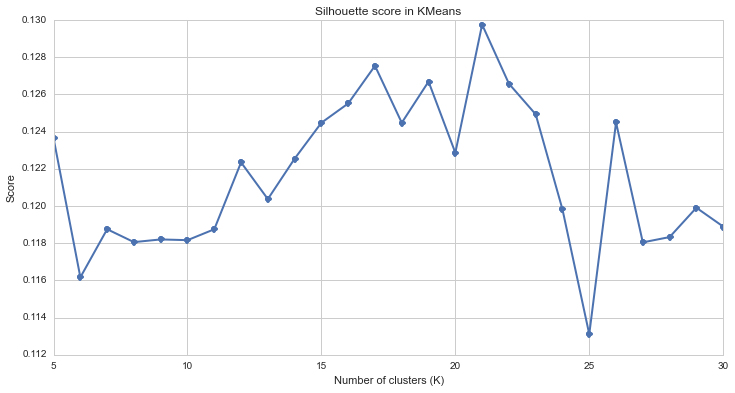

[0.12363746807706265,
 0.11616303995047278,
 0.11874906303680308,
 0.11805554234246352,
 0.1182004016419799,
 0.11816075215135775,
 0.1187466781804405,
 0.12234256267205308,
 0.12037006468471334,
 0.12254162565742491,
 0.12447304298501789,
 0.12551015780330227,
 0.1275349955511266,
 0.12447174545566256,
 0.12668682562214148,
 0.12285930611527326,
 0.12975311876911599,
 0.12657409824389218,
 0.12492609561431221,
 0.11981510222960744,
 0.11310549691900601,
 0.12448776764759557,
 0.11804235611634364,
 0.11832702643026742,
 0.11990382005315373,
 0.11889287679679358]

In [206]:
# Plot silhouette scores vs. K
range_n_clusters = range(5,31)
plot_s_score(df15D,range_n_clusters)

In [187]:
# Computing silhouette scores vs. K
range_n_clusters = range(5,31)
n_run = range(10)
s_score_mat = np.empty((len(n_run),len(range_n_clusters)),dtype='object')
for n in n_run:
    s_score_vec = plot_s_score(df15D,range_n_clusters,plot=False)
    s_score_mat[n,:]=s_score_vec
# Plotting silhouette scores vs. K
# ax = sns.tsplot(data=s_score_mat)
# ax.figure.set_size_inches(12,6)    

In [208]:
# Example
n_clusters = 21
labels, centroids, kmeans = run_Kmeans(data,n_clusters)
labels

array([ 3,  9,  3, ...,  5, 12,  9], dtype=int32)

<a id ='6-3-2'></a>
####3.2 AIC
According to [Introduction to Information Retrieval](http://nlp.stanford.edu/IR-book/html/htmledition/cluster-cardinality-in-k-means-1.html), AIC for kmeans can be computed by using intertia (RSS).

In [41]:
def plot_AIC_Kmeans(data,n_cluster_vec):
    """Compute AIC for each K in n_cluster_vec based on data, and plot AIC vs. K"""
    AIC_vec = []
    for n_cluster in n_cluster_vec:
        labels, centroids, kmeans = run_Kmeans(data,n_cluster,n_init=50)
        M = np.shape(data)[1]
        K = n_cluster
        RSS = kmeans.inertia_
        AIC = RSS + 2*M*K
        AIC_vec.append(AIC)    
    fig, ax = plt.subplots(1, 1)
    fig.set_size_inches(12, 6)
    ax.plot(n_cluster_vec, AIC_vec, marker = 'o', lw = 2)
    ax.set_title('AIC vlaues in KMeans (preference data)')
    ax.set_xlabel('Number of clusters (K)')
    ax.set_ylabel('AIC')  
    plt.show()        

<a id='AIC'></a>

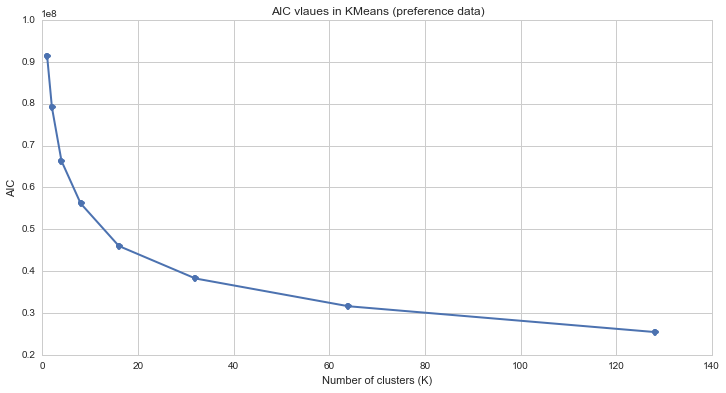

In [43]:
# Plot AIC for different Ks
n_cluster_vec = [2**x for x in range(8)]
plot_AIC_Kmeans(df15D,n_cluster_vec)

Because of high dimensionality of the data, AIC is dominated by the inertia and penalizing term (2MK, where M is feature dimensions, and K is the number of clusters) does not play a big role. Plus, the assumptions to use inertia instead of MLE are <b>if we view the model underlying  K-means as a Gaussian mixture with hard assignment, uniform cluster priors and identical spherical covariance matrices</b>, which is difficult to know and satisfy.

<a id='6-4'></a>
###4. Visualize each theme in the same cluster
<p>
<font color='blue'>[Figure](#1_theme)</font>

In [15]:
# %load plot_a_theme.py


# In[ ]:

"""Collection of functions for plotting a kuler theme in Lab space"""

def col_tuple2list(colormath_color):
    """Convert colormath to list"""
    color_list = []
    for i in range(3):
        color_list.append(colormath_color.get_value_tuple()[i])
    return color_list

def plot_scheme(schemeIdx,index1=0,index2=0):
    """ The 5 colors in each theme will be shown in a 3D space. 
        To show the ordinal properties of the colors, colors are connected with lines 
        Distance between colors is shown as text. 
        The first color is shown as a regular triangle.
        The last color is shown as an inverted triangle.
        The rest are shown as circles. """
    
    from mpl_toolkits.mplot3d import axes3d, Axes3D
    from colormath import color_diff
    from colormath.color_objects import LabColor, sRGBColor
    from colormath.color_conversions import convert_color

    # viewpoint
    if index1 == 'a' and index2 == 'b':
        el = 90
        az = -90
    elif index1 == 'L' and index2 == 'a':
        el = 0
        az = 90
    elif index1 == 'L' and index2 == 'b':
        el = 0
        az = 180
    elif int(index1) == 0 and int(index2) == 0:
        el = None
        az = None
        
    # draw a figure
    fig = plt.figure(figsize=(6,6))
    ax = fig.add_subplot(111, projection='3d')

    # loop over the colors in a scheme
    for i in range(5):
        # df_ already has cm format(ex. Lab1) and list format (ex. L1, a1...)

        # 1. conver Lab color to sRGB for assigning colors for the plot
        LabColor_cm = df_['Lab'+str(i+1)][schemeIdx]
        sRGBColor_cm = convert_color(LabColor_cm,sRGBColor)

        # 2. convert this value to list for plotting
        sRGBColor_list = col_tuple2list(sRGBColor_cm)
        r = min(sRGBColor_list[0],1)
        g = min(sRGBColor_list[1],1)
        b = min(sRGBColor_list[2],1)
        color = np.array([[r,g,b],[0,0,0]])

        # 3. load the Lab coordinates
        L = df_['L'+str(i+1)][schemeIdx]
        a = df_['a'+str(i+1)][schemeIdx]
        b = df_['b'+str(i+1)][schemeIdx]        

        # 4. draw each color (first: triangle, last: reversed triangle, in-betweens: circle)
        marker_vec = ['^','o','o','o','v']
        ax.scatter(a,b,L,c=color,s=250,marker=marker_vec[i])
            
        # 5. draw lines between dots
        if i > 0:
            L_prev = df_['L'+str(i)][schemeIdx]
            a_prev = df_['a'+str(i)][schemeIdx]
            b_prev = df_['b'+str(i)][schemeIdx]        
            ax.plot([a_prev,a],[b_prev,b],[L_prev,L],color='black',alpha=0.2)

            # 6. compute distance between dots
            LabColor_cm_prev = LabColor(L_prev,a_prev,b_prev)
            diff = color_diff.delta_e_cie2000(LabColor_cm,LabColor_cm_prev)
            ax.text((a_prev+a)/2,(b_prev+b)/2,(L_prev+L)/2,'%.1f' %diff,(1,0,0))
            
    # view angle
    ax.view_init(elev=el,azim=az)

    # labels
    ax.set_xlabel('a')
    ax.set_ylabel('b')
    ax.set_zlabel('L')
    ax.set_xlim3d(-128, 128)
    ax.set_ylim3d(-128, 128)
    ax.set_zlim3d(0, 100)
    # show theme name and number of likes
    ax.set_title('#'+str(schemeIdx)+':'+df.name[schemeIdx]+' ('+str(df.Likes[schemeIdx])+')')

def plot_color_in_scheme(df_input,ax,colorIdx,schemeIdx,index1=0,index2=0):

    from mpl_toolkits.mplot3d import axes3d, Axes3D
    from colormath import color_diff
    from colormath.color_objects import LabColor, sRGBColor
    from colormath.color_conversions import convert_color
    
    # viewpoint
    if index1 == 'a' and index2 == 'b':
        el = 90
        az = -90
    elif index1 == 'L' and index2 == 'a':
        el = 0
        az = 90
    elif index1 == 'L' and index2 == 'b':
        el = 0
        az = 180
    elif int(index1) == 0 and int(index2) == 0:
        el = None
        az = None
        
        # 1. conver Lab color to sRGB for assigning colors for the plot
        LabColor_cm = df_input['Lab'+str(colorIdx)][schemeIdx]
        sRGBColor_cm = convert_color(LabColor_cm,sRGBColor)

        # 2. convert this value to list for plotting
        sRGBColor_list = col_tuple2list(sRGBColor_cm)
        r = min(sRGBColor_list[0],1)
        g = min(sRGBColor_list[1],1)
        b = min(sRGBColor_list[2],1)
        color = np.array([[r,g,b],[0,0,0]])

        # 3. load the Lab coordinates
        L = df_input['L'+str(colorIdx)][schemeIdx]
        a = df_input['a'+str(colorIdx)][schemeIdx]
        b = df_input['b'+str(colorIdx)][schemeIdx]        

        # 4. draw each color (first: triangle, last: reversed triangle, in-betweens: circle)
        ax.scatter(a,b,L,c=color,s=250,marker='o')
            
    # view angle
    ax.view_init(elev=el,azim=az)

    ax.set_xlabel('a')
    ax.set_ylabel('b')
    ax.set_zlabel('L')
    ax.set_xlim3d(-128, 128)
    ax.set_ylim3d(-128, 128)
    ax.set_zlim3d(0, 100)


# In[ ]:





In [16]:
def plot_scheme_Kmeans(labels,i):
    """Plot a color theme based on the label from kmeans results"""
    """WARNING: this takes up a lot of memory, so only plot portions"""
    indices = np.where(labels==i)
    print indices
    print len(indices)
    for j in range(len(indices[0])):
        plot_scheme(indices[0][j])

<a id='1_theme'></a>

(array([  8,  31,  59, 104, 138, 186, 197, 254, 280, 355, 358, 372, 418,
       419, 425, 489]),)
1


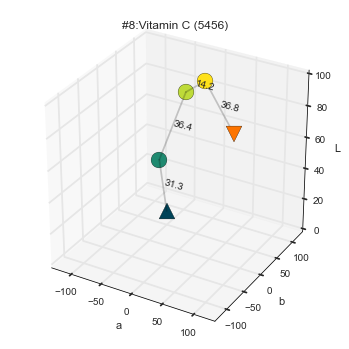

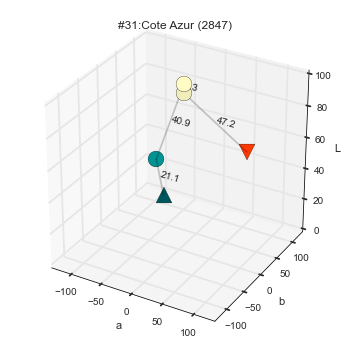

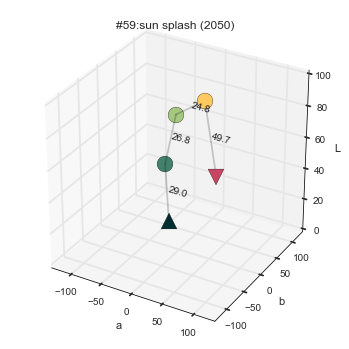

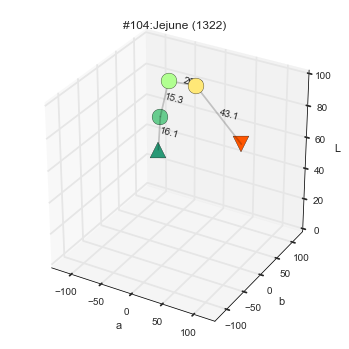

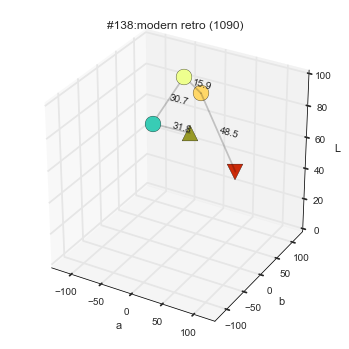

...

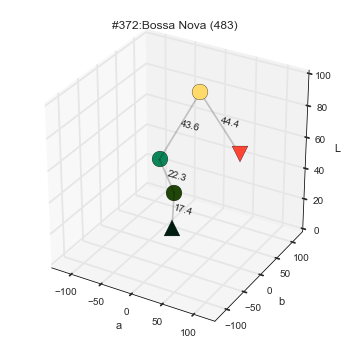

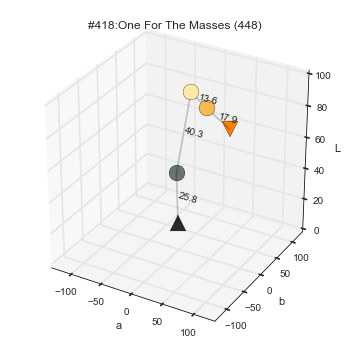

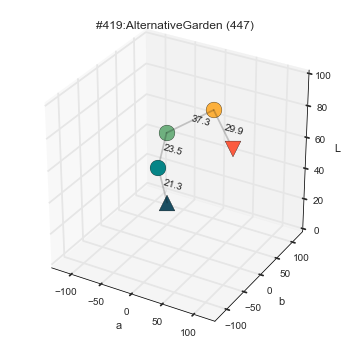

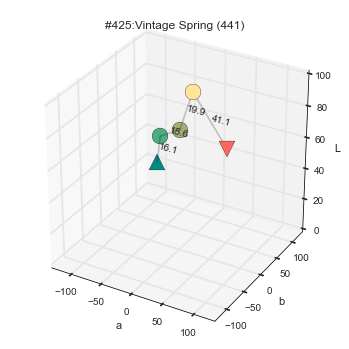

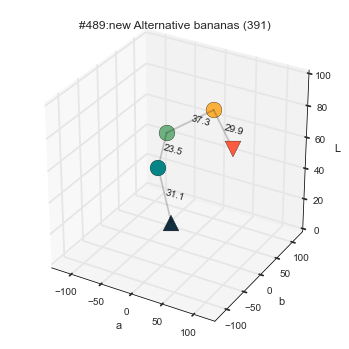

In [210]:
# Plot themes with label of 0 among the first 100 themes
clusterIdx_test = 0
plot_scheme_Kmeans(labels[:500],clusterIdx_test)

<a id='6-5'></a>
###5. Visualize all themes in the same cluster
<b>Rating score:</b> In the case of preference-implmented data, per cluster, we compute rating_score, the length of indices since we duplicated the data points based on preference. Then we sort the clusters based on the score and plot all color themes that belong to a cluster simultaneously.

In [213]:
rating_score_vec=[]
for clusterIdx in range(n_clusters): 
    indices = np.where(labels==clusterIdx)
    rating_score = len(indices[0])
    rating_score_vec.append(rating_score)
#Sort the cluster index based on rating_score
sorted_clusterIdx_list = sorted(range(len(rating_score_vec)), key=lambda k: rating_score_vec[k],reverse=True)
print sorted_clusterIdx_list

[18, 15, 3, 6, 17, 5, 10, 13, 9, 14, 11, 2, 8, 7, 0, 1, 19, 4, 20, 12, 16]


In [95]:
def plot_Kmeans_collapsed(df_input,labels,clusterIdx,figsize=10):
    """
    This function collapses all themes belong to a cluster (clusterIdx).
    Then, draw 5 plots, each of which corresponds to nth color in the themes
    Ex. The 1st plot is all the 1st colors from the themes with a cluster (clusterIdx)
    """
    # load indices
    indices = np.where(labels==clusterIdx)
    #print indices # print the schemeIdx's of this cluster
    rating_score = len(indices[0])
    
    # plotting
    len_x = figsize*1
    len_y = figsize*5
    fig = plt.figure(figsize=(len_y,len_x))    
    
    for k in range(5):
        colorIdx = k+1
        ax = fig.add_subplot(1,5,k+1,projection='3d')
        fig.suptitle('#' + str(clusterIdx) + ': ' + str(rating_score), fontsize=60)
        for j in range(len(indices[0])):
            schemeIdx = indices[0][j]
            plot_color_in_scheme(df_input,ax,colorIdx,schemeIdx)  

<a id='col_cloud'></a>

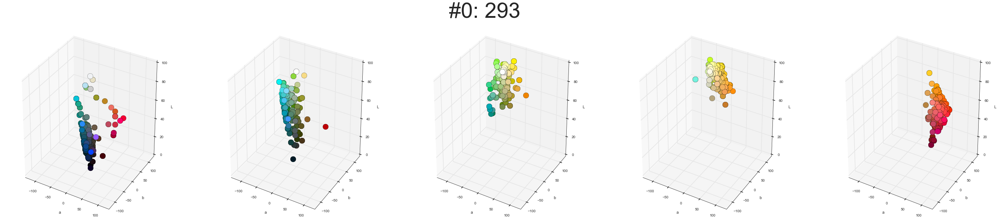

In [211]:
plot_Kmeans_collapsed(df_,labels,clusterIdx_test)

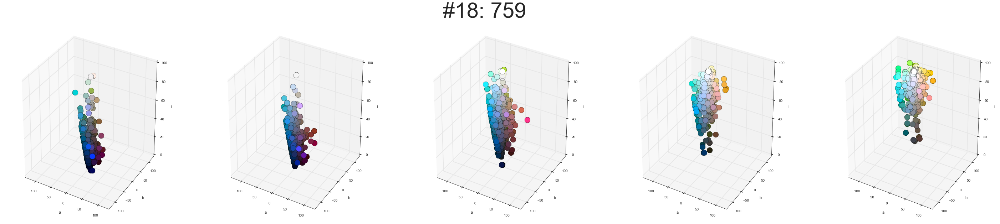

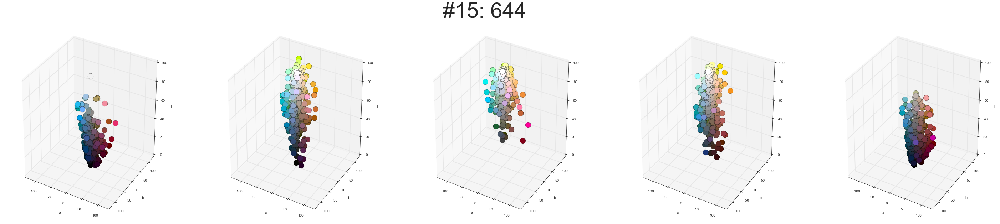

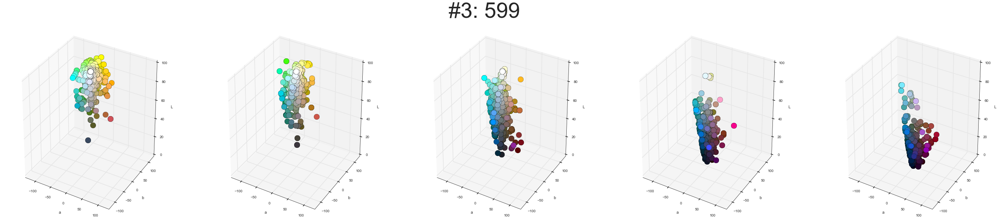

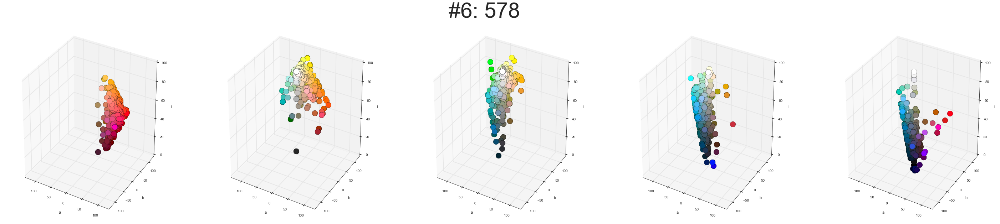

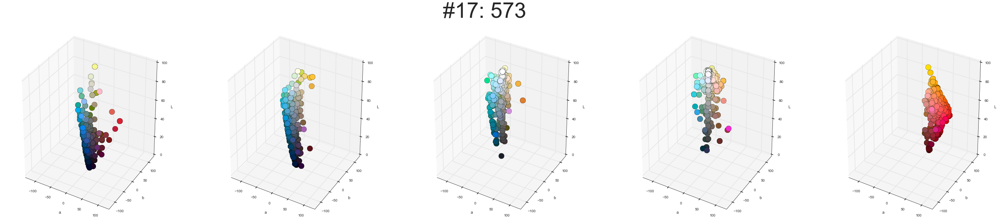

...

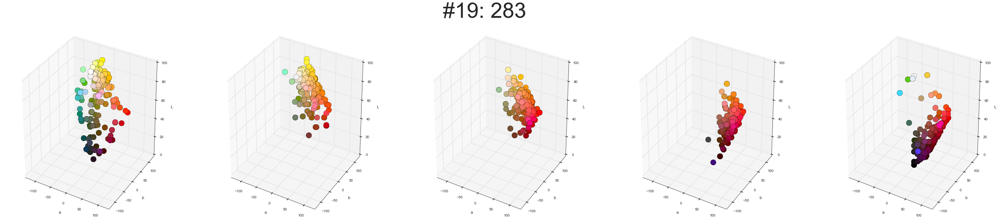

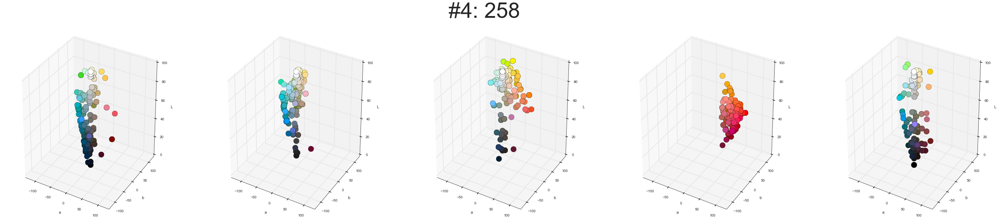

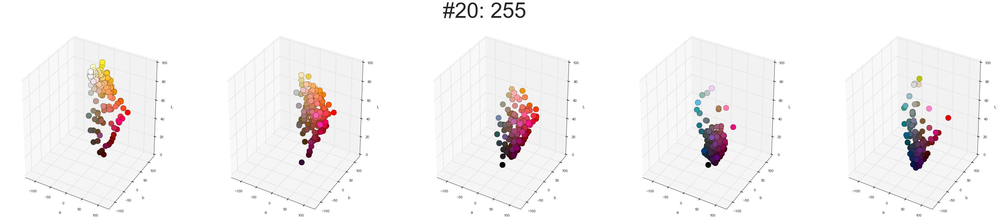

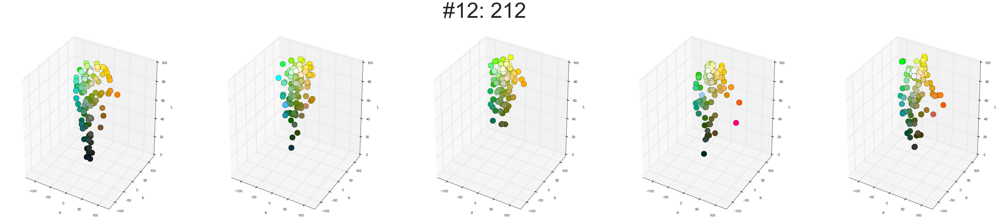

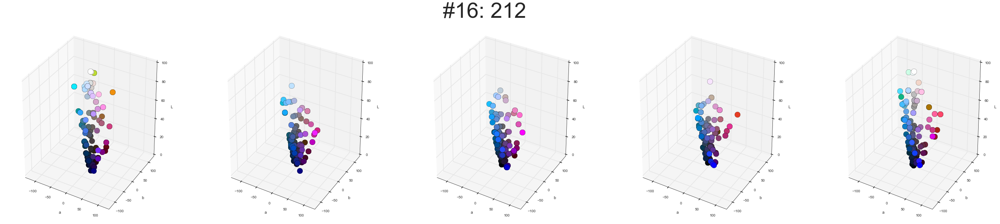

In [214]:
# Visualize all clusters in the same way, sorted by rating_score
for i in sorted_clusterIdx_list:
    plot_Kmeans_collapsed(df_,labels,i)